<a id="5"></a>


<font color="black" size=+1><b> Customers Analytics
Churn Prediction on Home Credit </b></font>

<a id="4"></a>

---
<font color="GREEN" size=+1><b> THE NIGHT OWLS</b></font>

---

    Kompi           : B
    Mentor          : Tantut Wahyu

    Nama Anggota
    1. Farid Asroful Anam             DS04037
    2. Diyah Esti Cahyo Pertiwi       DS04032
    3. Fenny Annggraini               DS04038
    4. Hanna Dhea Christi Sihombing   DS04043

Dataset yang kami gunakan merupakan dataset churn customer pada home credit. Dimana terdiri dari tujuh dataset yaitu application_train, bureau, bureau_balance, credit_card_balance, installment_payments, POS_CASH_balance, previous_application.

#**Import Libraries**##

In [ ]:
import numpy as np
import pandas as pd
from google.colab import drive
import matplotlib.pyplot as plt
import seaborn as sns
drive.mount('/content/drive')

Mounted at /content/drive


#**Data Preparation**

##**Dataset**

###**Application_train**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data1 = pd.read_csv('/content/drive/MyDrive/TheNightOwls-FinalProject/Dataset/application_train_clean.csv')
data1.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3',
       'OBS_30_CNT_SOCIAL_CIRCLE', 'DEF_30_CNT_SOCIAL_CIRCLE',
       'OBS_60_CNT_SOCIAL_CIRCLE', 'DEF_60_CNT_SOCIAL_CIRCLE',
       'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3', 'FLAG_DOCUMENT_4',
       'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7',
       'FLAG_DOCUMENT_8', 'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10',
       'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13',
       'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16',
       'FLAG_D

In [ ]:
d1 = data1[['SK_ID_CURR','TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN', 'AMT_INCOME_TOTAL',
       'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'NAME_TYPE_SUITE',
       'NAME_INCOME_TYPE', 'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'OCCUPATION_TYPE','EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']]
d1.shape

(307511, 21)

###**Bureau**

In [ ]:
data2 = pd.read_csv('/content/drive/MyDrive/dataset/bureau_clean.csv')
data2.columns

Index(['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'CREDIT_CURRENCY',
       'DAYS_CREDIT', 'CREDIT_DAY_OVERDUE', 'DAYS_CREDIT_ENDDATE',
       'DAYS_ENDDATE_FACT', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_LIMIT',
       'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE', 'DAYS_CREDIT_UPDATE'],
      dtype='object')

In [ ]:
d2 = data2[['SK_ID_CURR', 'SK_ID_BUREAU', 'CREDIT_ACTIVE', 'AMT_CREDIT_MAX_OVERDUE', 'CNT_CREDIT_PROLONG',
       'AMT_CREDIT_SUM', 'AMT_CREDIT_SUM_DEBT', 'AMT_CREDIT_SUM_OVERDUE', 'CREDIT_TYPE']]
d2.shape

(1110964, 9)

In [ ]:
d2 = d2.drop_duplicates(subset=['SK_ID_CURR'], keep = 'first')
d2.shape

(229346, 9)

In [ ]:
m1 = pd.merge(left = d1, right = d2, how = 'left', left_on = 'SK_ID_CURR', right_on = 'SK_ID_CURR')
m1.shape

(307511, 29)

In [ ]:
m1.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,EXT_SOURCE_2,EXT_SOURCE_3,SK_ID_BUREAU,CREDIT_ACTIVE,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE
0,100002.0,1.0,Cash loans,M,N,Y,0.0,High,406597.5,24700.5,...,0.2630,0.1394,6158904.0,Closed,4125.7026,0.0,40761.0,139002.34,0.0,Credit card
1,100003.0,0.0,Cash loans,F,N,N,0.0,High,1293502.5,35698.5,...,0.6220,0.7460,5885877.0,Closed,0.0000,0.0,22248.0,0.00,0.0,Consumer credit
2,100004.0,0.0,Revolving loans,M,Y,Y,0.0,Upper Middle,135000.0,6750.0,...,0.5560,0.7295,6829133.0,Closed,4125.7026,0.0,94500.0,0.00,0.0,Consumer credit
3,100006.0,0.0,Cash loans,F,N,Y,0.0,Upper Middle,312682.5,29686.5,...,0.6504,0.7460,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,100007.0,0.0,Cash loans,M,N,Y,0.0,Upper Middle,513000.0,21865.5,...,0.3228,0.7460,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


###**Bureau_balance**

In [ ]:
data3 = pd.read_csv('/content/drive/MyDrive/dataset/bureau_balance_clean.csv')
data3.columns

Index(['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS'], dtype='object')

In [ ]:
d3 = data3[['SK_ID_BUREAU', 'MONTHS_BALANCE', 'STATUS']]
d3.shape

(7929472, 3)

In [ ]:
d3 = d3.drop_duplicates(subset=['SK_ID_BUREAU'], keep = 'first')
d3.shape

(231913, 3)

In [ ]:
m2 = pd.merge(left = m1, right = d3, how = 'left', left_on = 'SK_ID_BUREAU', right_on = 'SK_ID_BUREAU')
m2.shape

(307511, 31)



'
###**Posh_Cash_Balance**

In [ ]:
data4 = pd.read_csv('/content/drive/MyDrive/TheNightOwls-FinalProject/Dataset/New_PosCashBalance.csv')
data4.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'MONTHS_BALANCE', 'CNT_INSTALMENT',
       'CNT_INSTALMENT_FUTURE', 'NAME_CONTRACT_STATUS', 'SK_DPD',
       'SK_DPD_DEF'],
      dtype='object')

In [ ]:
d4 = data4[['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_STATUS']]

In [ ]:
d4 = d4.drop_duplicates(subset=['SK_ID_CURR'], keep = 'first')
d4.shape

(337252, 3)

In [ ]:
m3 = pd.merge(left = m2, right = d4, how = 'left', left_on = 'SK_ID_CURR', right_on = 'SK_ID_CURR')
m3.shape

(307511, 33)

###**Credit_Card_Balance**

In [ ]:
data5 = pd.read_csv('/content/drive/MyDrive/TheNightOwls-FinalProject/Dataset/credit_card_balance_clean.csv')
data5.columns

Index(['SK_ID_PREV', 'AMT_BALANCE', 'AMT_CREDIT_LIMIT_ACTUAL',
       'AMT_DRAWINGS_ATM_CURRENT', 'AMT_DRAWINGS_CURRENT',
       'AMT_DRAWINGS_OTHER_CURRENT', 'AMT_DRAWINGS_POS_CURRENT',
       'AMT_INST_MIN_REGULARITY', 'AMT_PAYMENT_CURRENT',
       'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_RECEIVABLE_PRINCIPAL',
       'AMT_RECIVABLE', 'AMT_TOTAL_RECEIVABLE', 'CNT_DRAWINGS_ATM_CURRENT',
       'CNT_DRAWINGS_CURRENT', 'CNT_DRAWINGS_OTHER_CURRENT',
       'CNT_DRAWINGS_POS_CURRENT', 'CNT_INSTALMENT_MATURE_CUM',
       'NAME_CONTRACT_STATUS', 'SK_DPD', 'SK_DPD_DEF'],
      dtype='object')

In [ ]:
d5 = data5[['SK_ID_PREV', 'AMT_CREDIT_LIMIT_ACTUAL', 'AMT_PAYMENT_CURRENT', 'AMT_TOTAL_RECEIVABLE']]
d5.shape

(1962423, 4)

In [ ]:
m4 = pd.merge(left = m3, right = d5, how = 'left', left_on = 'SK_ID_PREV', right_on = 'SK_ID_PREV')
m4.shape

(307511, 36)

###**previous_application**

In [ ]:
data6 = pd.read_csv('/content/drive/MyDrive/TheNightOwls-FinalProject/Dataset/New_PreviousApp.csv')
data6.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY',
       'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE',
       'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
       'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY',
       'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY',
       'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE',
       'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE',
       'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE',
       'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE',
       'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY',
       'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION',
       'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL'],
      dtype='object')

In [ ]:
d6 = data6[['SK_ID_CURR', 'AMT_APPLICATION', 'AMT_DOWN_PAYMENT', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'CODE_REJECT_REASON', 'NAME_PORTFOLIO', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION',
       'DAYS_LAST_DUE' ]]

In [ ]:
d6 = d6.drop_duplicates(subset=['SK_ID_CURR'], keep = 'first')
d6.shape

(338857, 10)

In [ ]:
m5 = pd.merge(left = m4, right = d6, how = 'left', left_on = 'SK_ID_CURR', right_on = 'SK_ID_CURR')
m5.shape

(307511, 45)

In [ ]:
m5.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 307511 entries, 0 to 307510
Data columns (total 45 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   SK_ID_CURR                  307507 non-null  float64
 1   TARGET                      307507 non-null  float64
 2   NAME_CONTRACT_TYPE          307507 non-null  object 
 3   CODE_GENDER                 307511 non-null  object 
 4   FLAG_OWN_CAR                307507 non-null  object 
 5   FLAG_OWN_REALTY             307507 non-null  object 
 6   CNT_CHILDREN                307507 non-null  float64
 7   AMT_INCOME_TOTAL            307511 non-null  object 
 8   AMT_CREDIT                  307507 non-null  float64
 9   AMT_ANNUITY                 307507 non-null  float64
 10  AMT_GOODS_PRICE             307507 non-null  float64
 11  NAME_TYPE_SUITE             307507 non-null  object 
 12  NAME_INCOME_TYPE            307507 non-null  object 
 13  NAME_FAMILY_ST

###**installments_payments**

In [ ]:
data7 = pd.read_csv('/content/drive/MyDrive/TheNightOwls-FinalProject/Dataset/installments_payments_clean.csv')
data7.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NUM_INSTALMENT_VERSION',
       'NUM_INSTALMENT_NUMBER', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT',
       'AMT_INSTALMENT', 'AMT_PAYMENT'],
      dtype='object')

In [ ]:
d7 = data7[['SK_ID_CURR', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT', 'AMT_PAYMENT']]

In [ ]:
d7 = d7.drop_duplicates(subset=['SK_ID_CURR'], keep = 'first')
d7.shape

##**Merge data**

Menggabungkan seluurh dataset yang dimilki kedalam dataframe yang baru agar dapat dengan mudah diolah.

In [ ]:
m6 = pd.merge(left = m5, right = d7, how = 'left', left_on = 'SK_ID_CURR', right_on = 'SK_ID_CURR')
m6.shape

(307511, 48)

In [ ]:
m6.to_csv('data_fix_BUANGET.csv', index=False)

###**Check Missing Value**

Memeriksa jumlah missing value dari setiap feature yang ada pada dataframe baru yang sudah digabungkan sebelumnya, dapat dilihat missing value sangat banyak pada beberapa feature yang ada. Tentunya missing value tersebut kami kelola agar tidak terdapat lagi nilai - nilai yang hilang pada dataset.

In [ ]:
m6.isnull().sum()

SK_ID_CURR                         4
TARGET                             4
NAME_CONTRACT_TYPE                 4
CODE_GENDER                        0
FLAG_OWN_CAR                       4
FLAG_OWN_REALTY                    4
CNT_CHILDREN                       4
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         4
AMT_ANNUITY                        4
AMT_GOODS_PRICE                    4
NAME_TYPE_SUITE                    4
NAME_INCOME_TYPE                   4
NAME_FAMILY_STATUS                 4
NAME_HOUSING_TYPE                  4
REGION_POPULATION_RELATIVE         4
DAYS_BIRTH                         4
OCCUPATION_TYPE                    4
EXT_SOURCE_1                       4
EXT_SOURCE_2                       4
EXT_SOURCE_3                       4
SK_ID_BUREAU                  110762
CREDIT_ACTIVE                 110762
AMT_CREDIT_MAX_OVERDUE        110762
CNT_CREDIT_PROLONG            110762
AMT_CREDIT_SUM                110762
AMT_CREDIT_SUM_DEBT           110762
A

In [ ]:
m6 = m6.drop_duplicates(subset=['SK_ID_CURR'], keep = 'first')
m6.shape

(307508, 48)

In [ ]:
m6.isnull().sum()

SK_ID_CURR                         1
TARGET                             1
NAME_CONTRACT_TYPE                 1
CODE_GENDER                        0
FLAG_OWN_CAR                       1
FLAG_OWN_REALTY                    1
CNT_CHILDREN                       1
AMT_INCOME_TOTAL                   0
AMT_CREDIT                         1
AMT_ANNUITY                        1
AMT_GOODS_PRICE                    1
NAME_TYPE_SUITE                    1
NAME_INCOME_TYPE                   1
NAME_FAMILY_STATUS                 1
NAME_HOUSING_TYPE                  1
REGION_POPULATION_RELATIVE         1
DAYS_BIRTH                         1
OCCUPATION_TYPE                    1
EXT_SOURCE_1                       1
EXT_SOURCE_2                       1
EXT_SOURCE_3                       1
SK_ID_BUREAU                  110759
CREDIT_ACTIVE                 110759
AMT_CREDIT_MAX_OVERDUE        110759
CNT_CREDIT_PROLONG            110759
AMT_CREDIT_SUM                110759
AMT_CREDIT_SUM_DEBT           110759
A

In [ ]:
m6.to_csv('data_fixx_buangett.csv', index=False)

###**Handling missing value**

Karena banyaknya feature yang terdapat missing value oleh karena itu, disini kami melakukan handling terhadap nilai - nilai yang hilang dengan menggunakan beberapa cara seperti mengisinya menggunakan modus, mean, ataupun median.

In [ ]:
m6['SK_ID_CURR'] = m6['SK_ID_CURR'].fillna('Tidak Terdeteksi')
m6['TARGET'] = m6['TARGET'].fillna(m6['TARGET'].mode()[0])
m6['NAME_CONTRACT_TYPE'] = m6['NAME_CONTRACT_TYPE'].fillna(m6['NAME_CONTRACT_TYPE'].mode()[0])
m6['FLAG_OWN_CAR'] = m6['FLAG_OWN_CAR'].fillna(m6['FLAG_OWN_CAR'].mode()[0])
m6['FLAG_OWN_REALTY'] = m6['FLAG_OWN_REALTY'].fillna(m6['FLAG_OWN_REALTY'].mode()[0])
m6['CNT_CHILDREN'] = m6['CNT_CHILDREN'].fillna(m6['CNT_CHILDREN'].mode()[0])
m6['AMT_CREDIT'] = m6['AMT_CREDIT'].fillna(m6['AMT_CREDIT'].mean())
m6['AMT_ANNUITY'] = m6['AMT_ANNUITY'].fillna(m6['AMT_ANNUITY'].mean())
m6['AMT_GOODS_PRICE'] = m6['AMT_GOODS_PRICE'].fillna(m6['AMT_GOODS_PRICE'].mean())
m6['NAME_TYPE_SUITE'] = m6['NAME_TYPE_SUITE'].fillna('Tidak Terdeteksi')
m6['NAME_INCOME_TYPE'] = m6['NAME_INCOME_TYPE'].fillna('Tidak Terdeteksi')
m6['NAME_FAMILY_STATUS'] =m6['NAME_FAMILY_STATUS'].fillna('Unknown')
m6['NAME_HOUSING_TYPE'] = m6['NAME_HOUSING_TYPE'].fillna('Tidak Terdeteksi')
m6['REGION_POPULATION_RELATIVE'] = m6['REGION_POPULATION_RELATIVE'].fillna(m6['REGION_POPULATION_RELATIVE'].mean())
m6['DAYS_BIRTH'] = m6['DAYS_BIRTH'].fillna(m6['DAYS_BIRTH'].mode()[0])
m6['OCCUPATION_TYPE'] = m6['OCCUPATION_TYPE'].fillna('Tidak Terdeteksi')
m6['EXT_SOURCE_1'] = m6['EXT_SOURCE_1'].fillna(m6['EXT_SOURCE_1'].mean())
m6['EXT_SOURCE_2'] = m6['EXT_SOURCE_2'].fillna(m6['EXT_SOURCE_2'].mean())
m6['EXT_SOURCE_3'] = m6['EXT_SOURCE_3'].fillna(m6['EXT_SOURCE_3'].mean())
m6['SK_ID_BUREAU'] = m6['SK_ID_BUREAU'].fillna('Tidak Terdeteksi')
m6['CREDIT_ACTIVE'] = m6['CREDIT_ACTIVE'].fillna('Tidak Terdeteksi')
m6['AMT_CREDIT_MAX_OVERDUE'] = m6['AMT_CREDIT_MAX_OVERDUE'].fillna(m6['AMT_CREDIT_MAX_OVERDUE'].mean())
m6['CNT_CREDIT_PROLONG'] = m6['CNT_CREDIT_PROLONG'].fillna(m6['CNT_CREDIT_PROLONG'].mode()[0])
m6['AMT_CREDIT_SUM'] = m6['AMT_CREDIT_SUM'].fillna(m6['AMT_CREDIT_SUM'].mean())
m6['AMT_CREDIT_SUM_DEBT'] = m6['AMT_CREDIT_SUM_DEBT'].fillna(m6['AMT_CREDIT_SUM_DEBT'].mean())
m6['AMT_CREDIT_SUM_OVERDUE'] = m6['AMT_CREDIT_SUM_OVERDUE'].fillna(m6['AMT_CREDIT_SUM_OVERDUE'].mean())
m6['CREDIT_TYPE'] = m6['CREDIT_TYPE'].fillna('Unknown type of loan')
m6['MONTHS_BALANCE'] = m6['MONTHS_BALANCE'].fillna(m6['MONTHS_BALANCE'].mean())
m6['STATUS'] = m6['STATUS'].fillna(m6['STATUS'].mode()[0])

In [ ]:
m6['SK_ID_PREV'] = m6['SK_ID_PREV'].fillna('Tidak Terdeteksi')
m6['NAME_CONTRACT_STATUS_x'] = m6['NAME_CONTRACT_STATUS_x'].fillna('Tidak Diketahui')
del m6['AMT_CREDIT_LIMIT_ACTUAL']

In [ ]:
del m6['AMT_PAYMENT_CURRENT']

In [ ]:
del m6['AMT_TOTAL_RECEIVABLE']

In [ ]:
m6['AMT_APPLICATION'] = m6['AMT_APPLICATION'].fillna(m6['AMT_APPLICATION'].mean())
m6['AMT_DOWN_PAYMENT'] = m6['AMT_DOWN_PAYMENT'].fillna(m6['AMT_DOWN_PAYMENT'].mean())
m6['NAME_CONTRACT_STATUS_y'] = m6['NAME_CONTRACT_STATUS_y'].fillna('Tidak Terdeteksi')
m6['DAYS_DECISION'] = m6['DAYS_DECISION'].fillna(m6['DAYS_DECISION'].mode()[0])
m6['CODE_REJECT_REASON'] = m6['CODE_REJECT_REASON'].fillna('Tidak Terdeteksi')
m6['NAME_PORTFOLIO'] = m6['NAME_PORTFOLIO'].fillna('Tidak Terdeteksi')

In [ ]:
m6['DAYS_FIRST_DUE'] = m6['DAYS_FIRST_DUE'].fillna(m6['DAYS_FIRST_DUE'].mode()[0])
m6['DAYS_LAST_DUE_1ST_VERSION'] = m6['DAYS_LAST_DUE_1ST_VERSION'].fillna(m6['DAYS_LAST_DUE_1ST_VERSION'].mode()[0])
m6['DAYS_LAST_DUE'] = m6['DAYS_LAST_DUE'].fillna(m6['DAYS_LAST_DUE'].mode()[0])
m6['DAYS_INSTALMENT'] = m6['DAYS_INSTALMENT'].fillna(m6['DAYS_INSTALMENT'].mode()[0])
m6['DAYS_ENTRY_PAYMENT'] = m6['DAYS_ENTRY_PAYMENT'].fillna(m6['DAYS_ENTRY_PAYMENT'].mode()[0])

In [ ]:
m6['AMT_PAYMENT'] = m6['AMT_PAYMENT'].fillna(m6['AMT_PAYMENT'].mean())

In [ ]:
m6['AMT_PAYMENT'].value_counts()

18175.848674     15869
2250.000000       2101
9000.000000       1737
4500.000000       1266
6750.000000       1213
                 ...  
52089.390000         1
188908.830000        1
4621.635000          1
26807.040000         1
11090.835000         1
Name: AMT_PAYMENT, Length: 184737, dtype: int64

Dapat dilihat pada dataframe yang baru tadi tidak ada lagi missing value sehingga data dapat di kelola untuk ke tahap berikutnya.

In [ ]:
m6.isnull().sum()

SK_ID_CURR                    0
TARGET                        0
NAME_CONTRACT_TYPE            0
CODE_GENDER                   0
FLAG_OWN_CAR                  0
FLAG_OWN_REALTY               0
CNT_CHILDREN                  0
AMT_INCOME_TOTAL              0
AMT_CREDIT                    0
AMT_ANNUITY                   0
AMT_GOODS_PRICE               0
NAME_TYPE_SUITE               0
NAME_INCOME_TYPE              0
NAME_FAMILY_STATUS            0
NAME_HOUSING_TYPE             0
REGION_POPULATION_RELATIVE    0
DAYS_BIRTH                    0
OCCUPATION_TYPE               0
EXT_SOURCE_1                  0
EXT_SOURCE_2                  0
EXT_SOURCE_3                  0
SK_ID_BUREAU                  0
CREDIT_ACTIVE                 0
AMT_CREDIT_MAX_OVERDUE        0
CNT_CREDIT_PROLONG            0
AMT_CREDIT_SUM                0
AMT_CREDIT_SUM_DEBT           0
AMT_CREDIT_SUM_OVERDUE        0
CREDIT_TYPE                   0
MONTHS_BALANCE                0
STATUS                        0
SK_ID_PR

###**Save file hasil merge dataset**

Selanjutnya, menyimpan kembali data hasil merge yang sudah bersih dari missing value.

In [ ]:
m6.to_csv('/content/drive/MyDrive/TheNightOwls-FinalProject/DATA_FIX.csv', index=False)

In [ ]:
m6.to_csv('DATA_FIX.csv', index=False)

In [ ]:
m6 = pd.read_csv('/content/drive/MyDrive/Data Science/DATA_FIX.csv')
m6

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,NAME_CONTRACT_STATUS_y,DAYS_DECISION,CODE_REJECT_REASON,NAME_PORTFOLIO,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_PAYMENT
0,1.0,0,0,1,1,0.0,2,213322.5,15651.0,162000.0,...,2,-509.0,2,2,365243.0,365243.0,365243.0,-225.0,-235.0,26955.540000
1,1.0,0,0,0,0,0.0,2,450000.0,35685.0,450000.0,...,0,-844.0,8,3,-813.0,-663.0,-663.0,-693.0,-703.0,4450.635000
2,1.0,0,0,0,0,0.0,0,1206954.0,31968.0,945000.0,...,3,-238.0,6,4,365243.0,365243.0,365243.0,-119.0,-91.0,18175.848674
3,1.0,0,1,1,1,0.0,0,521280.0,31630.5,450000.0,...,2,-203.0,1,0,365243.0,365243.0,365243.0,-549.0,-557.0,7648.200000
4,1.0,0,0,0,1,0.0,0,454500.0,16825.5,454500.0,...,0,-951.0,8,3,-919.0,-229.0,-769.0,-890.0,-916.0,183799.940000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565361,0.0,0,0,0,1,0.0,2,225000.0,22050.0,225000.0,...,2,-1454.0,1,3,365243.0,365243.0,365243.0,-1405.0,-1407.0,22770.404000
565362,0.0,0,1,0,0,0.0,2,254700.0,27558.0,225000.0,...,0,-273.0,8,3,-210.0,0.0,-30.0,-60.0,-101.0,6605.910000
565363,0.0,0,0,0,1,0.0,2,269550.0,12001.5,225000.0,...,0,-2497.0,8,3,-2466.0,-2316.0,-2316.0,-2316.0,-2328.0,10046.880000
565364,0.0,0,0,0,1,0.0,2,677664.0,29979.0,585000.0,...,0,-1909.0,8,3,-1866.0,-1716.0,-1716.0,-2722.0,-2744.0,3971.880000


#**Exploraty Data Analysis**

In [ ]:
!pip install dataprep

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 42.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 60.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.6/133.6 kB 13.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 57.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 58.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 43.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 764.0/764.0 kB 33.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.4/6.4 MB 63.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.5/114.5 kB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 1.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append(pd.DataFrame({col: [nrows - npresent]}, index=["Others"]))
/usr/local/lib/python3.10/dist-packages/dataprep/eda/distribution/render.py:274: FutureWarning: The frame.append method is depreca

DataPrep Report
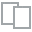
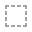
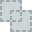
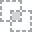
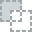
...
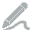
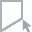
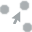
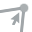
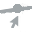

In [ ]:
from dataprep.eda import create_report
create_report(m6)

#**Data Encoding**

Data encoding adalah sebuah proses untuk mengubah data kategorikal menjadi numerikal. Dimana masih banyak sekali feature - feature yang berupa kategorikal. Oleh sebab itu, dilakukan pengubahan agar kolom-kolom menjadi numerikal.

In [ ]:
m6.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 565366 entries, 0 to 565365
Data columns (total 42 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   TARGET                      565366 non-null  float64
 1   NAME_CONTRACT_TYPE          565366 non-null  int64  
 2   CODE_GENDER                 565366 non-null  int64  
 3   FLAG_OWN_CAR                565366 non-null  int64  
 4   FLAG_OWN_REALTY             565366 non-null  int64  
 5   CNT_CHILDREN                565366 non-null  float64
 6   AMT_INCOME_TOTAL            565366 non-null  int64  
 7   AMT_CREDIT                  565366 non-null  float64
 8   AMT_ANNUITY                 565366 non-null  float64
 9   AMT_GOODS_PRICE             565366 non-null  float64
 10  NAME_TYPE_SUITE             565366 non-null  int64  
 11  NAME_INCOME_TYPE            565366 non-null  int64  
 12  NAME_FAMILY_STATUS          565366 non-null  int64  
 13  NAME_HOUSING_T

In [ ]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()

In [ ]:
# Jika dataset belum di encoding, lakukan code berikut :
# del m6['SK_ID_CURR']
# del m6['SK_ID_BUREAU']
# del m6['SK_ID_PREV']

In [ ]:
# Encode Variable Categorical
m6['NAME_CONTRACT_TYPE'] = LE.fit_transform(m6['NAME_CONTRACT_TYPE'])
m6['CODE_GENDER'] = LE.fit_transform(m6['CODE_GENDER'])
m6['FLAG_OWN_CAR'] = LE.fit_transform(m6['FLAG_OWN_CAR'])
m6['FLAG_OWN_REALTY'] = LE.fit_transform(m6['FLAG_OWN_REALTY'])
m6['AMT_INCOME_TOTAL'] = LE.fit_transform(m6['AMT_INCOME_TOTAL'])
m6['NAME_TYPE_SUITE'] = LE.fit_transform(m6['NAME_TYPE_SUITE'])
m6['NAME_INCOME_TYPE'] = LE.fit_transform(m6['NAME_INCOME_TYPE'])
m6['NAME_FAMILY_STATUS'] = LE.fit_transform(m6['NAME_FAMILY_STATUS'])
m6['NAME_HOUSING_TYPE'] = LE.fit_transform(m6['NAME_HOUSING_TYPE'])
m6['DAYS_BIRTH'] = LE.fit_transform(m6['DAYS_BIRTH'])
m6['OCCUPATION_TYPE'] = LE.fit_transform(m6['OCCUPATION_TYPE'])
m6['CREDIT_ACTIVE'] = LE.fit_transform(m6['CREDIT_ACTIVE'])
m6['CREDIT_TYPE'] = LE.fit_transform(m6['CREDIT_TYPE'])
m6['NAME_CONTRACT_STATUS_x'] = LE.fit_transform(m6['NAME_CONTRACT_STATUS_x'])
m6['NAME_CONTRACT_STATUS_y'] = LE.fit_transform(m6['NAME_CONTRACT_STATUS_y'])
m6['CODE_REJECT_REASON'] = LE.fit_transform(m6['CODE_REJECT_REASON'])
m6['NAME_PORTFOLIO'] = LE.fit_transform(m6['NAME_PORTFOLIO'])
m6['STATUS'] = LE.fit_transform(m6['STATUS'])

#**Handling Data Imbalance**

O = untuk yang tidak churn


---


1 = untuk yang churn

In [ ]:
m6['TARGET'].value_counts()

1.0    282683
0.0    282683
Name: TARGET, dtype: int64

In [ ]:
from sklearn.utils import resample
df_majority = m6[(m6['TARGET']==0)]
df_minority = m6[(m6['TARGET']==1)]

df_minority_upsampled = resample(df_minority, replace = True, n_samples = 282683, random_state = 42)

m6 = pd.concat([df_minority_upsampled, df_majority])

In [ ]:
m6['TARGET'].value_counts()

1.0    282683
0.0    282683
Name: TARGET, dtype: int64

#**Modelling**

In [ ]:
m6

,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,...,NAME_CONTRACT_STATUS_y,DAYS_DECISION,CODE_REJECT_REASON,NAME_PORTFOLIO,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_PAYMENT
121958,1.0,0,1,0,1,0.0,1,131922.0,8100.0,94500.0,...,2,-521.0,2,3,365243.0,365243.0,365243.0,-147.0,-152.0,12363.300000
146867,1.0,0,1,1,0,0.0,2,225000.0,14548.5,225000.0,...,3,-238.0,6,4,365243.0,365243.0,365243.0,-119.0,-91.0,18175.848674
131932,1.0,0,0,0,1,0.0,2,203760.0,22072.5,180000.0,...,0,-705.0,8,2,-675.0,15.0,-45.0,-1360.0,-1387.0,9206.100000
259178,1.0,0,0,0,1,0.0,2,309420.0,15178.5,202500.0,...,0,-2687.0,8,3,-2656.0,-2506.0,-2506.0,-23.0,-20.0,4413.780000
119879,1.0,0,0,0,1,0.0,2,808650.0,31464.0,675000.0,...,1,-273.0,8,5,365243.0,365243.0,365243.0,-126.0,-126.0,4500.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565361,0.0,0,0,0,1,0.0,2,225000.0,22050.0,225000.0,...,2,-1454.0,1,3,365243.0,365243.0,365243.0,-1405.0,-1407.0,22770.404000
565362,0.0,0,1,0,0,0.0,2,254700.0,27558.0,225000.0,...,0,-273.0,8,3,-210.0,0.0,-30.0,-60.0,-101.0,6605.910000
565363,0.0,0,0,0,1,0.0,2,269550.0,12001.5,225000.0,...,0,-2497.0,8,3,-2466.0,-2316.0,-2316.0,-2316.0,-2328.0,10046.880000
565364,0.0,0,0,0,1,0.0,2,677664.0,29979.0,585000.0,...,0,-1909.0,8,3,-1866.0,-1716.0,-1716.0,-2722.0,-2744.0,3971.880000


##**Memisahkan Variabel Dependen dan Independen**

Variabel dependen yang digunakan adalah data pada kolom 'TARGET', kolom lainnya merupakan variabel independen. Pisahkan variabel independen sebagai X dan independen sebagai y!

In [ ]:
#X variable independen
X = m6.loc[:, m6.columns != 'TARGET']

#y variable dependen
y = m6['TARGET']

##**Scalling Data**

Lakukan scalling pada X!

In [ ]:
#Menggunakan MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

MMS = MinMaxScaler()
X= MMS.fit_transform(X)
pd.DataFrame(X)

,0,1,2,3,4,5,6,7,8,9,...,31,32,33,34,35,36,37,38,39,40
0,0.0,1.0,0.0,1.0,0.0,0.5,0.021703,0.025290,0.013468,1.000000,...,0.50,0.822260,0.222222,0.6,1.000000,1.000000,1.000000,0.950342,0.951299,0.003559
1,0.0,1.0,1.0,0.0,0.0,1.0,0.044944,0.050439,0.046016,1.000000,...,0.75,0.919178,0.666667,0.8,1.000000,1.000000,1.000000,0.959932,0.971104,0.005233
2,0.0,0.0,0.0,1.0,0.0,1.0,0.039640,0.079782,0.034792,1.000000,...,0.00,0.759247,0.888889,0.4,0.006022,0.007651,0.007709,0.534932,0.550325,0.002650
3,0.0,0.0,0.0,1.0,0.0,1.0,0.066022,0.052896,0.040404,0.142857,...,0.00,0.080479,0.888889,0.6,0.000641,0.000802,0.001024,0.992808,0.994156,0.001271
4,0.0,0.0,0.0,1.0,0.0,1.0,0.190674,0.116409,0.158249,1.000000,...,0.25,0.907192,0.888889,1.0,1.000000,1.000000,1.000000,0.957534,0.959740,0.001295
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565361,0.0,0.0,0.0,1.0,0.0,1.0,0.044944,0.079695,0.046016,1.000000,...,0.50,0.502740,0.111111,0.6,1.000000,1.000000,1.000000,0.519521,0.543831,0.006555
565362,0.0,1.0,0.0,0.0,0.0,1.0,0.052360,0.101176,0.046016,1.000000,...,0.00,0.907192,0.888889,0.6,0.007285,0.007611,0.007750,0.980137,0.967857,0.001902
565363,0.0,0.0,0.0,1.0,0.0,1.0,0.056067,0.040505,0.046016,1.000000,...,0.00,0.145548,0.888889,0.6,0.001157,0.001318,0.001540,0.207534,0.244805,0.002892
565364,0.0,0.0,0.0,1.0,0.0,1.0,0.157969,0.110618,0.135802,1.000000,...,0.00,0.346918,0.888889,0.6,0.002787,0.002948,0.003170,0.068493,0.109740,0.001143


Scaling adalah suatu cara untuk membuat numerical data pada dataset memiliki rentang nilai (scale) yang sama. Tidak ada lagi satu variabel data yang mendominasi variabel data lainnya. Scaling ini juga termasuk kedalam proses preprocessing oleh sebab itu code-nya seperti contoh diatas.

##**Splitting Data**

Pisahkan dataset menjadi training dan testing dataset dengan perbandingan 70:30!

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.3, random_state=100)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(395756, 41)
(169610, 41)
(395756,)
(169610,)


Proses splitting data merupakan pembagian data menjadi data untuk training dan data untuk testing dimana disini saya membagi menjadi 70% data training dan 30% data testing, karena semakin banyak data yang dilatih mesin akan semakin banyak belajar sehingga bisa optimal dalam membangun model nantinya, dimana dengan random state sebanyak 100.

##**Model Fitting**

Membangun model machine learning menggunakan algoritma - algoritma berikut ini!

###**Decision Tree**

In [ ]:
from sklearn.tree import DecisionTreeClassifier # model fitting and prediction
from sklearn.metrics import classification_report, confusion_matrix # checking performance of model

model_tree = DecisionTreeClassifier().fit(X_train, y_train)
pred_tree = model_tree.predict(X_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_test, pred_tree))

CONFUSION MATRIX
[[76125  9126]
 [  104 84255]]


###**Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression # model fitting and prediction
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score # checking performance of model

model_logi = LogisticRegression().fit(X_train, y_train)
pred_logi = model_logi.predict(X_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_test, pred_logi))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CONFUSION MATRIX
[[58198 27053]
 [29641 54718]]


###**Random Forest**

In [ ]:
from sklearn.ensemble import RandomForestClassifier # model fitting and prediction
from sklearn.metrics import classification_report, confusion_matrix # checking performance of model

model_forest = RandomForestClassifier().fit(X_train, y_train)
pred_forest = model_forest.predict(X_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_test, pred_forest))

###**Xgboost**

In [ ]:
import xgboost as xgb

model_xgb = xgb.XGBClassifier(max_depth = 6,  objective='binary:logistic', learning_rate=0.3, n_estimators=100)
model_xgb.fit(X=X_train, y=y_train)
pred_xgb = model_xgb.predict(X_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_test, pred_xgb))

CONFUSION MATRIX
[[62863 22388]
 [19852 64507]]


###**Gradient boosting**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

model_boost = GradientBoostingClassifier().fit(X_train, y_train)
pred_boost = model_boost.predict(X_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_test, pred_boost))

CONFUSION MATRIX
[[59258 25993]
 [26506 57853]]


##**Model Performance Analytics - Classification Report**

Tampilkan hasil evaluasi model yang telah dibangun menggunakan classification report!

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score

###**Decision Tree**

In [ ]:
print('CLASSIFICATION REPORT')
print(classification_report(y_test, pred_tree))

CLASSIFICATION REPORT
              precision    recall  f1-score   support

         0.0       1.00      0.89      0.94     85251
         1.0       0.90      1.00      0.95     84359

    accuracy                           0.95    169610
   macro avg       0.95      0.95      0.95    169610
weighted avg       0.95      0.95      0.95    169610



In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, pred_tree)
print(f'Accuracy yang didapatkan dari Decession Tree: {accuracy:.5f}')

Accuracy yang didapatkan dari Decession Tree: 0.94558


- Acurracy : Terlihat pada hasil report akurasi yang didapat sebesar 95% yang mana artinya model dapat memprediksi secara akurat sebesar 95%.
- Precission : Dimana terlihat presisi yang didapat 95% artinya memiliki hubungan yang cukup kuat antara data yang diminta dengan hasil prediksi yang diberikan oleh model.
- Recall : Recall yang didapat sebesar 95% artinya keberhasilan model dalam menemukan kembali sebuah informasi hanya sebesar itu tingkat akurasinya.
- F1- Score :menggambarkan perbandingan rata-rata precision dan recall yang dibobotkan. Dimana didapatkan hasil sebesar 95%.

Jadi dapat terlihat pada report akurasi yang dihasilkan dari model Decission Tree kurang baik karena sudah overfitting dimana menyentuh angka 95%.

###**Logistic Regression**

In [ ]:
print('CLASSIFICATION REPORT')
print(classification_report(y_test, pred_logi))

CLASSIFICATION REPORT
              precision    recall  f1-score   support

         0.0       0.66      0.68      0.67     85251
         1.0       0.67      0.65      0.66     84359

    accuracy                           0.67    169610
   macro avg       0.67      0.67      0.67    169610
weighted avg       0.67      0.67      0.67    169610



In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, pred_logi)
print(f'Accuracy yang didapatkan dari Logistic Regression: {accuracy:.5f}')

Accuracy yang didapatkan dari Logistic Regression: 0.66574


- Acurracy : Terlihat pada hasil report akurasi yang didapat sebesar 67% yang mana artinya model dapat memprediksi secara akurat sebesar 67%.
- Precission : Dimana terlihat presisi yang didapat 67% artinya memiliki hubungan yang cukup kuat antara data yang diminta dengan hasil prediksi yang diberikan oleh model.
- Recall : Recall yang didapat sebesar 67% artinya keberhasilan model dalam menemukan kembali sebuah informasi hanya sebesar itu tingkat akurasinya.
- F1- Score :menggambarkan perbandingan rata-rata precision dan recall yang dibobotkan. Dimana didapatkan hasil sebesar 67%.


Jadi dapat terlihat pada report akurasi yang dihasilkan dari model Logistic Regression kurang baik karena hanya menyentuh angka 67%.

###**Random Forest**

In [ ]:
print('CLASSIFICATION REPORT')
print(classification_report(y_test, pred_forest))

In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, pred_forest)
print(f'Accuracy yang didapatkan dari Random Forest: {accuracy:.5f}')

###**Xgboost**

In [ ]:
print('CLASSIFICATION REPORT')
print(classification_report(y_test, pred_xgb))

CLASSIFICATION REPORT
              precision    recall  f1-score   support

         0.0       0.76      0.74      0.75     85251
         1.0       0.74      0.76      0.75     84359

    accuracy                           0.75    169610
   macro avg       0.75      0.75      0.75    169610
weighted avg       0.75      0.75      0.75    169610



In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, pred_xgb)
print(f'Accuracy yang didapatkan dari XGboost: {accuracy:.5f}')

Accuracy yang didapatkan dari XGboost: 0.75096


- Acurracy : Terlihat pada hasil report akurasi yang didapat sebesar 75% yang mana artinya model dapat memprediksi secara akurat sebesar 75%.
- Precission : Dimana terlihat presisi yang didapat 75% artinya memiliki hubungan yang cukup kuat antara data yang diminta dengan hasil prediksi yang diberikan oleh model.
- Recall : Recall yang didapat sebesar 75% artinya keberhasilan model dalam menemukan kembali sebuah informasi hanya sebesar itu tingkat akurasinya.
- F1- Score :menggambarkan perbandingan rata-rata precision dan recall yang dibobotkan. Dimana didapatkan hasil sebesar 75%.

Jadi dapat terlihat pada report akurasi yang dihasilkan dari model XGBoost cukup baik dimana menyentuh angka 75%.

###**Gradient boosting**

In [ ]:
print('CLASSIFICATION REPORT')
print(classification_report(y_test, pred_boost))

CLASSIFICATION REPORT
              precision    recall  f1-score   support

         0.0       0.69      0.70      0.69     85251
         1.0       0.69      0.69      0.69     84359

    accuracy                           0.69    169610
   macro avg       0.69      0.69      0.69    169610
weighted avg       0.69      0.69      0.69    169610



In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, pred_boost)
print(f'Accuracy yang didapatkan dari Gradient Boosting: {accuracy:.5f}')

Accuracy yang didapatkan dari Gradient Boosting: 0.69047


- Acurracy : Terlihat pada hasil report akurasi yang didapat sebesar 69% yang mana artinya model dapat memprediksi secara akurat sebesar 69%.
- Precission : Dimana terlihat presisi yang didapat 69% artinya memiliki hubungan yang cukup kuat antara data yang diminta dengan hasil prediksi yang diberikan oleh model.
- Recall : Recall yang didapat sebesar 69% artinya keberhasilan model dalam menemukan kembali sebuah informasi hanya sebesar itu tingkat akurasinya.
- F1- Score :menggambarkan perbandingan rata-rata precision dan recall yang dibobotkan. Dimana didapatkan hasil sebesar 69%.

Jadi dapat terlihat pada report akurasi yang dihasilkan dari Gradient Boosting kurang baik karena dimana hanya menyentuh angka 69% namun jika diatas ini seharusnya  sudah lumayan cukup baik.

***
**Insight**
***
Interpretasi hasil classification report model!

**Jawaban**

Berdasarkan hasil classification report dari kelima model di dapatkan lah hasil akurasi dimana model XGBoost ternyata lebih baik dalam memprediksi data dibanding dengan model - model lainnya. Pada kasus ini yang mana memiliki tingkat nilai akurasi yang normal sebesar 75% pada model XGBoost.

Sehingga kami menyeleksi hanya tiga model dari kelima model tersebut untuk dilakukan uji coba kembali diantarnya model XGboost, Logistic Regression, dan Gradient Boosting.


#**Feature Importance**

Text(0.5, 1.0, 'Feature importance using Decision Tree')

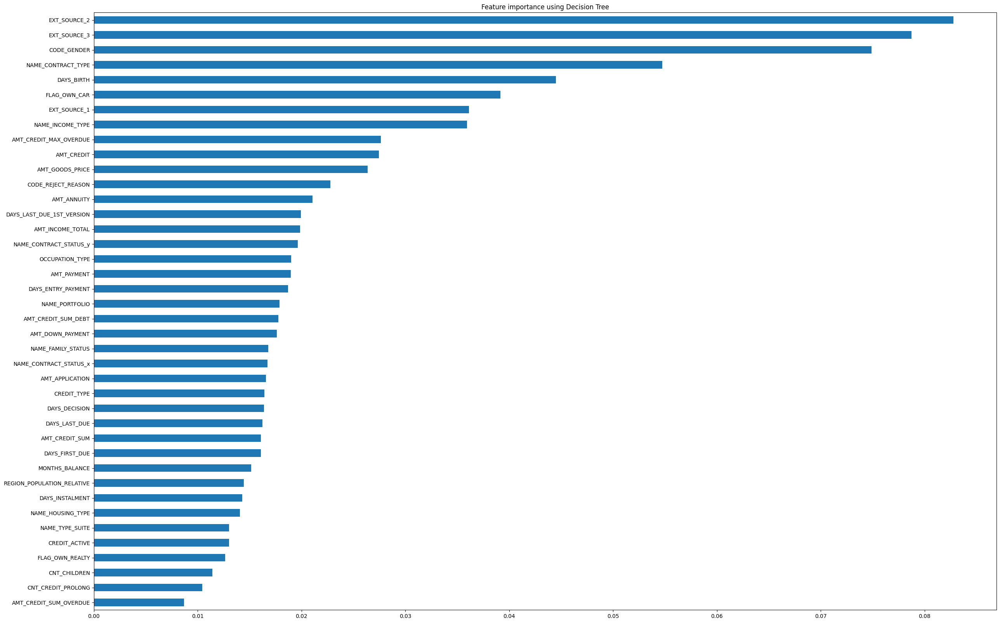

In [ ]:
#Features imprtances dengan decision tree
X = pd.DataFrame(X)
coef_dtc = pd.Series(model_xgb.feature_importances_, index = X.columns)
plt.figure(figsize=(30,20))
imp_coef_dtc = coef_dtc.sort_values()
imp_coef_dtc.plot(kind = "barh")
plt.title("Feature importance using Decision Tree")

Berdasarkan feature - feature yang penting di dapatkanlah beberapa feature yang paling mempengaruhi, tiga diantar feature yang sangat berpengaruh tersebut adalah Ext_Source_2, Ext_Source_3, dan Code_Gender.

#**CORELATION**

Berikut ini untuk melihat korelasi antar feature - feature yang ada.

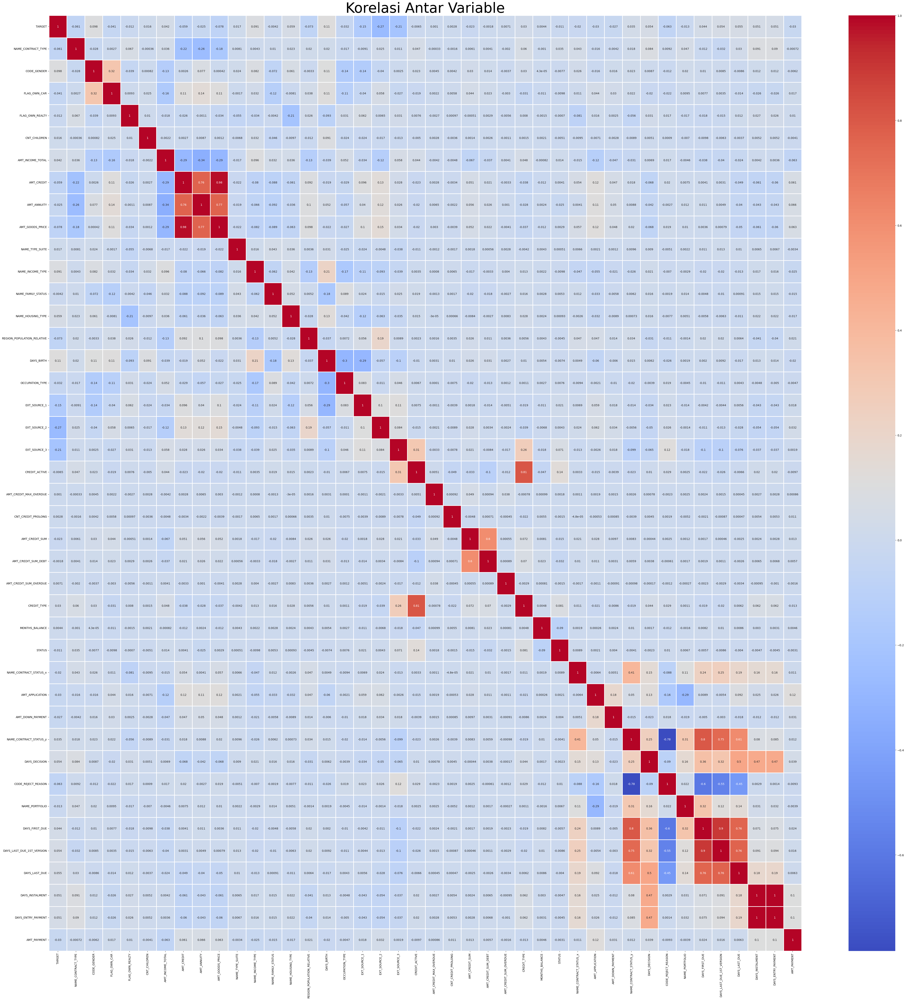

In [ ]:
#Melihat korelasi antar variable untuk mencari feature yang penting
plt.rcParams['figure.figsize'] = (60, 60)
sns.heatmap(m6.corr(), annot = True, linewidths = 0.9, cmap = 'coolwarm')
plt.title('Korelasi Antar Variable', fontsize = 50)
plt.show()

#**Feature Selection**

Dilakukan feature selection dimana untuk mengurangi jumlah feature - feature yang tidak relevan terhadap pemodelan, dimana kami melakukan proses ini berdasarkan korelasi yang telah kami dapatkan sebelumnya.

In [ ]:
m7 = m6[['TARGET','CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'EXT_SOURCE_3',
 'CREDIT_ACTIVE', 'CREDIT_TYPE', 'NAME_CONTRACT_STATUS_x', 'NAME_CONTRACT_STATUS_y', 'DAYS_DECISION', 'CODE_REJECT_REASON',
  'NAME_PORTFOLIO', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE', 'DAYS_INSTALMENT', 'DAY S_ENTRY_PAYMENT']]

In [ ]:
#Cari Fitur Importance pada dataset yang telah melalui fitur selection


In [ ]:
m7.to_csv('DATA_FIX_BUANGET.csv', index=False)

#**Modelling Fitur Pilihan**

In [ ]:
#Jika sudah memiliki dataset "DATA_FIX_BUANGET" maka, lakukan saja tahap modeling berikut :
m7 = pd.read_csv('/content/drive/MyDrive/Data Science/DATA_FIX_BUANGET.csv')

## **Memisahakan Variabel Dependen & Independen**

In [ ]:
#X variable independen
X_new = m7.loc[:, m7.columns != 'TARGET']

#y variable dependen
y_new = m7['TARGET']

##**Scalling New Data**



In [ ]:
#Menggunakan MinMaxScaler
from sklearn.preprocessing import MinMaxScaler

mms = MinMaxScaler()
X_new= mms.fit_transform(X_new)
pd.DataFrame(X_new)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,1.0,0.0,0.021703,0.025290,0.013468,0.832491,0.0,0.250,0.000000,0.50,0.822260,0.222222,0.6,1.000000,1.000000,1.000000,0.950342,0.951299
1,1.0,1.0,0.044944,0.050439,0.046016,0.520700,0.0,0.250,1.000000,0.75,0.919178,0.666667,0.8,1.000000,1.000000,1.000000,0.959932,0.971104
2,0.0,0.0,0.039640,0.079782,0.034792,0.374855,0.5,0.250,0.000000,0.00,0.759247,0.888889,0.4,0.007651,0.006022,0.007709,0.534932,0.550325
3,0.0,0.0,0.066022,0.052896,0.040404,0.692900,0.5,0.250,0.000000,0.00,0.080479,0.888889,0.6,0.000802,0.000641,0.001024,0.992808,0.994156
4,0.0,0.0,0.190674,0.116409,0.158249,0.202656,0.0,0.375,0.000000,0.25,0.907192,0.888889,1.0,1.000000,1.000000,1.000000,0.957534,0.959740
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
565361,0.0,0.0,0.044944,0.079695,0.046016,0.828024,0.5,0.250,0.000000,0.50,0.502740,0.111111,0.6,1.000000,1.000000,1.000000,0.519521,0.543831
565362,1.0,0.0,0.052360,0.101176,0.046016,0.832491,1.0,1.000,0.857143,0.00,0.907192,0.888889,0.6,0.007611,0.007285,0.007750,0.980137,0.967857
565363,0.0,0.0,0.056067,0.040505,0.046016,0.832491,1.0,1.000,0.428571,0.00,0.145548,0.888889,0.6,0.001318,0.001157,0.001540,0.207534,0.244805
565364,0.0,0.0,0.157969,0.110618,0.135802,0.243863,0.5,0.250,0.000000,0.00,0.346918,0.888889,0.6,0.002948,0.002787,0.003170,0.068493,0.109740


##**Splitting New Data**

In [ ]:
from sklearn.model_selection import train_test_split
X_new_train, X_new_test, y_new_train, y_new_test = train_test_split(X_new,y_new,test_size=0.3, random_state=100)
print(X_new_train.shape)
print(X_new_test.shape)
print(y_new_train.shape)
print(y_new_test.shape)

(395756, 18)
(169610, 18)
(395756,)
(169610,)


Kembali melakukan pemodelan dari dataset yang baru dimana data yang sudah di lakukan feature engineering sebelumnya, mulai dari memisahkan variabel dependen dan indepen, lalu scalling data untuk membuat numerical data pada dataset memiliki rentang nilai (scale) yang sama, selanjutnya melakukan pembagian data train dan test dimana di bagi menjadi perbandingan 70% untuk training dan 30% untuk testing dan dengan random state sebanyak 100.

##**Model Fitting**

Melakukan pemodelan kembali dengan dataset yang baru yang berisi feature - feature yang relevan, dimana sudah melalui proses feature engineering sebelumnya.

###**Logistic Regression**

In [ ]:
from sklearn.linear_model import LogisticRegression # model fitting and prediction
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score # checking performance of model

model_lr = LogisticRegression().fit(X_new_train, y_new_train)
pred_lr = model_lr.predict(X_new_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_new_test, pred_lr))

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


CONFUSION MATRIX
[[54877 30374]
 [33594 50765]]


In [ ]:
print('CLASSIFICATION REPORT')
print(classification_report(y_new_test, pred_lr))

CLASSIFICATION REPORT
              precision    recall  f1-score   support

         0.0       0.62      0.64      0.63     85251
         1.0       0.63      0.60      0.61     84359

    accuracy                           0.62    169610
   macro avg       0.62      0.62      0.62    169610
weighted avg       0.62      0.62      0.62    169610



In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_new_test, pred_lr)
print(f'Accuracy yang didapatkan dari Logistic Regression: {accuracy:.5f}')

Accuracy yang didapatkan dari Logistic Regression: 0.62285


###**Xgboots**

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score # checking performance of model
import xgboost as xgb

model_xgb_new = xgb.XGBClassifier(max_depth = 6,  objective='binary:logistic', learning_rate=0.3, n_estimators=100)
model_xgb_new.fit(X = X_new_train, y = y_new_train)
pred_xgb_new = model_xgb_new.predict(X_new_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_new_test, pred_xgb_new))

CONFUSION MATRIX
[[59872 25379]
 [24142 60217]]


In [ ]:
print('CLASSIFICATION REPORT')
print(classification_report(y_new_test, pred_xgb_new))

CLASSIFICATION REPORT
              precision    recall  f1-score   support

         0.0       0.71      0.70      0.71     85251
         1.0       0.70      0.71      0.71     84359

    accuracy                           0.71    169610
   macro avg       0.71      0.71      0.71    169610
weighted avg       0.71      0.71      0.71    169610



In [ ]:
from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_new_test, pred_xgb_new)
print(f'Accuracy yang didapatkan dari XGboost: {accuracy:.5f}')

Accuracy yang didapatkan dari XGboost: 0.70803


###**Gradient Boosting**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

model_gb = GradientBoostingClassifier().fit(X_new_train, y_new_train)
pred_gb = model_gb.predict(X_new_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_new_test, pred_gb))

CONFUSION MATRIX
[[57081 28170]
 [31139 53220]]


In [ ]:
print('CLASSIFICATION REPORT')
print(classification_report(y_new_test, pred_gb))

CLASSIFICATION REPORT
              precision    recall  f1-score   support

         0.0       0.65      0.67      0.66     85251
         1.0       0.65      0.63      0.64     84359

    accuracy                           0.65    169610
   macro avg       0.65      0.65      0.65    169610
weighted avg       0.65      0.65      0.65    169610



In [ ]:
accuracy = accuracy_score(y_new_test, pred_gb)
print(f'Accuracy yang didapatkan dari Gradient Boosting: {accuracy:.5f}')

Accuracy yang didapatkan dari Gradient Boosting: 0.65032


***
**Insight**
***
Interpretasi hasil classification report model!

**Jawaban**

Berdasarkan hasil classification report sebelum dilakukan hyperparameter tuning dari ketiga model di dapatkan lah hasil akurasi dimana model XGBoost ternyata lebih baik dalam memprediksi data dibanding dengan model - model lainnya. Pada kasus ini yang mana memiliki tingkat nilai akurasi yang normal sebesar 71% pada model XGBoost. Dan model Graident boosting lebih rendah akurasinya yaitu hanya sebesar 65% dan Logistic Regresion memiliki akurasi sebesar 62%.

Jadi dapat disimpulkan bahwa model XGBoost merupakan model terbaik yang akan kami fokuskan dan gunakan untuk prediksi churn.


#**Hyperparameter Tunning**

###**Logistic Regression**

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV

# Definisikan hyperparameter yang akan dituning
param_grid = {
    # 'C': [0.1, 1.0, 10.0],
    # 'penalty': ['l1', 'l2'],
    # 'solver': ['liblinear', 'saga', 'newton-cg','lbfgs','sag'],
    # 'max_iter' : [100,500,1000,10000],
    'class_weight' : ['none','balanced']
}




In [ ]:
# Inisialisasi GridSearchCV
grid_search_lr = GridSearchCV(model_lr, param_grid, cv=5)

# Melakukan hyperparameter tuning pada training set
grid_search_lr.fit(X_new_train, y_new_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'class_weight': ['none', 'balanced']})

In [ ]:
# Menampilkan parameter terbaik yang ditemukan
print("Best parameters: ", grid_search_lr.best_params_)
print("Best Score: ", grid_search_lr.best_score_)

Best parameters:  {'class_weight': 'balanced'}
Best Score:  0.6240259260638925


**Parameter Hasil Tuning dengan Gradient Boosting yang paling akurat:**
<br> C : 10.0 Score:  0.6244630634791326
<br> penalty : l2 Score:  0.6240638280459992
<br> solver : lbfgs Score:  0.6240638280459992
<br> max_iter : 100 Score:  0.6240638280459992
<br> class_weight : balanced Score:  0.6240259260638925

#### **Modeling Kembali dengan parameter tuning**

In [ ]:
from sklearn.linear_model import LogisticRegression # model fitting and prediction
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score # checking performance of model
from sklearn.model_selection import GridSearchCV

model_lr = LogisticRegression(C=10.0, penalty='l2', solver='lbfgs', max_iter=100, class_weight='balanced').fit(X_new_train, y_new_train)
pred_lr = model_lr.predict(X_new_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_new_test, pred_lr))

CONFUSION MATRIX
[[55026 30225]
 [33626 50733]]


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Prediksi menggunakan model dengan hyperparameter terbaik
y_pred_new = grid_search_lr.predict(X_new_test)

# Evaluasi model
print(classification_report(y_new_test, pred_lr))

              precision    recall  f1-score   support

         0.0       0.62      0.65      0.63     85251
         1.0       0.63      0.60      0.61     84359

    accuracy                           0.62    169610
   macro avg       0.62      0.62      0.62    169610
weighted avg       0.62      0.62      0.62    169610



In [ ]:
accuracy = accuracy_score(y_new_test, pred_lr)
print(f'Accuracy yang didapatkan dari Gradient Boosting: {accuracy:.5f}')

Accuracy yang didapatkan dari Gradient Boosting: 0.62354


###**XGBoost**

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score

In [ ]:
# Definisikan hyperparameter yang ingin diuji
param_grid = {
    # 'max_depth': [3, 5, 7],
    # 'learning_rate': [0.1, 0.01, 0.001],
    # 'n_estimators': [100, 200, 300],
    # 'gamma': [0, 0.1, 0.2]
}

# Inisialisasi GridSearchCV
grid_search_xgb = GridSearchCV(estimator=model_xgb_new, param_grid=param_grid, cv=5)


In [ ]:
# Melakukan tuning hyperparameter pada dataset
grid_search_xgb.fit(X_new_train, y_new_train)

# Menampilkan hasil terbaik dari tuning
print("Best Parameters: ", grid_search_xgb.best_params_)
print("Best Score: ", grid_search_xgb.best_score_)

Best Parameters:  {}
Best Score:  0.7112867563945762


**Parameter Hasil Tuning dengan Gradient Boosting yang paling akurat:**
<br> max_depth : 7
<br> learning_rate : 0.1
<br> n_estimators : 300
<br> gamma : 0.1

#### **Modeling Kembali dengan parameter tuning**

In [ ]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score # checking performance of model

model_xgb_new = xgb.XGBClassifier(max_depth = 7,  objective='binary:logistic', learning_rate=0.1, n_estimators=300, gamma=0.1)
model_xgb_new.fit(X = X_new_train, y = y_new_train)
pred_xgb_new = model_xgb_new.predict(X_new_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_new_test, pred_xgb_new))

CONFUSION MATRIX
[[62507 22744]
 [20093 64266]]


Text(0.5, 1.0, 'Confusion Matrix of XGBoots')

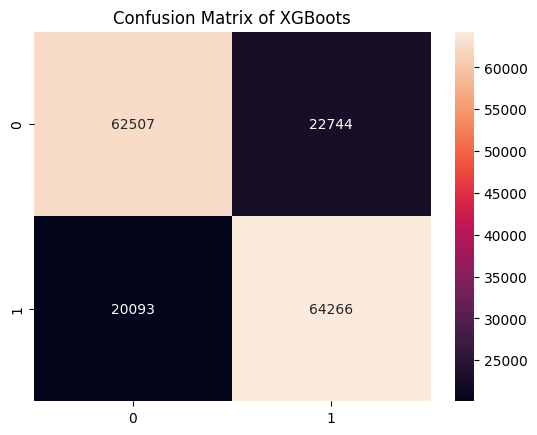

In [ ]:
#Confusion Matrix untuk model decision tree
from sklearn.metrics import classification_report, confusion_matrix
cm_dtc = confusion_matrix(y_new_test, pred_xgb_new)
sns.heatmap(cm_dtc, annot=True, fmt='d').set_title('Confusion Matrix of XGBoots')

In [ ]:
# Prediksi menggunakan model dengan hyperparameter terbaik
y_pred_new = grid_search_xgb.predict(X_new_test)

# Evaluasi model
print(classification_report(y_new_test, pred_xgb_new))

              precision    recall  f1-score   support

         0.0       0.76      0.73      0.74     85251
         1.0       0.74      0.76      0.75     84359

    accuracy                           0.75    169610
   macro avg       0.75      0.75      0.75    169610
weighted avg       0.75      0.75      0.75    169610



In [ ]:
accuracy = accuracy_score(y_new_test, pred_xgb_new)
print(f'Accuracy yang didapatkan dari Gradient Boosting: {accuracy:.5f}')

Accuracy yang didapatkan dari Gradient Boosting: 0.74744


###**Gradient Boosting**

In [ ]:
#import library yang dibutuhkan
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

new_gbc = GradientBoostingClassifier(random_state=100)

#Membuat parameter
param_gbc = {
    # 'n_estimators': [50, 100, 150],
    # 'learning_rate': [0.1, 0.01, 0.001],
    # 'max_depth': [3, 5, 7]
}

#Membuat grid search
grid_gbc = GridSearchCV(estimator = new_gbc, param_grid=param_gbc, cv=5, n_jobs=-1, verbose=1, scoring='accuracy')


In [ ]:
#Fiting grid
grid_gbc.fit(X_new_train, y_new_train)

# Menampilkan parameter terbaik yang ditemukan
print("Best parameters: ", grid_gbc.best_params_)
print("Best Score: ", grid_gbc.best_score_)

Fitting 5 folds for each of 1 candidates, totalling 5 fits
Best parameters:  {}
Best Score:  0.6502895803347347


**Parameter Hasil Tuning dengan Gradient Boosting yang paling akurat:**
<br> max_depth : 7 Score:  0.7003987383509456
<br> learning_rate : 0.1 Score:  0.6502895803347347
<br> n_estimators : 150 score (0.6539711435014134)
<br> gamma : 0.1

#### **Modeling Kembali dengan parameter tuning**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

model_gb = GradientBoostingClassifier(max_depth = 7, learning_rate=0.1, n_estimators=150).fit(X_new_train, y_new_train)
pred_gb = model_gb.predict(X_new_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_new_test, pred_gb))

CONFUSION MATRIX
[[60810 24441]
 [23942 60417]]


In [ ]:
#Mendapatkan estimator terbaik
gbc_best_estim = grid_gbc.best_estimator_
gbc_best_estim

#Melihat test accuracy dan confusion matrix-nya
print('Test Accuracy :', accuracy_score(y_new_test, gbc_best_estim.predict(X_new_test)))
print('Test Confusion Matrix: ')
print(confusion_matrix(y_new_test, gbc_best_estim.predict(X_new_test)))

Test Accuracy : 0.6503154295147692
Test Confusion Matrix: 
[[57080 28171]
 [31139 53220]]


In [ ]:
print('CLASSIFICATION REPORT')
print(classification_report(y_new_test, pred_gb))

CLASSIFICATION REPORT
              precision    recall  f1-score   support

         0.0       0.72      0.71      0.72     85251
         1.0       0.71      0.72      0.71     84359

    accuracy                           0.71    169610
   macro avg       0.71      0.71      0.71    169610
weighted avg       0.71      0.71      0.71    169610



In [ ]:
accuracy = accuracy_score(y_new_test, pred_gb)
print(f'Accuracy yang didapatkan dari Gradient Boosting: {accuracy:.5f}')

Accuracy yang didapatkan dari Gradient Boosting: 0.71476


##**Hasil Hyperparameter Tunning**
Dari hasil Hyperparameter Tunning diatas, kami menggunakan model XGBoost sebab model yang memiliki akurasi tertinggi adalah XGBoost yaitu sebesar 74,74774% ≈ 75%.

***
**Insight**
***
Interpretasi hasil classification report model!

**Jawaban**

Berdasarkan hasil classification report setelah dilakukan hyperparameter tuning dari ketiga model di dapatkan lah hasil akurasi dimana model XGBoost ternyata masih lebih baik dalam memprediksi data dibanding dengan model - model lainnya. Pada kasus ini yang mana memiliki tingkat nilai akurasi yang normal sebesar 75% pada model XGBoost setelah di hyperparameter tuning. Dan model Graident boosting lebih rendah akurasinya yaitu hanya sebesar 71% dan Logistic Regresion memiliki akurasi sebesar 62%.

Jadi dapat disimpulkan bahwa model XGBoost merupakan model terbaik yang akan kami fokuskan dan gunakan untuk prediksi churn.

# **Feature Importance**

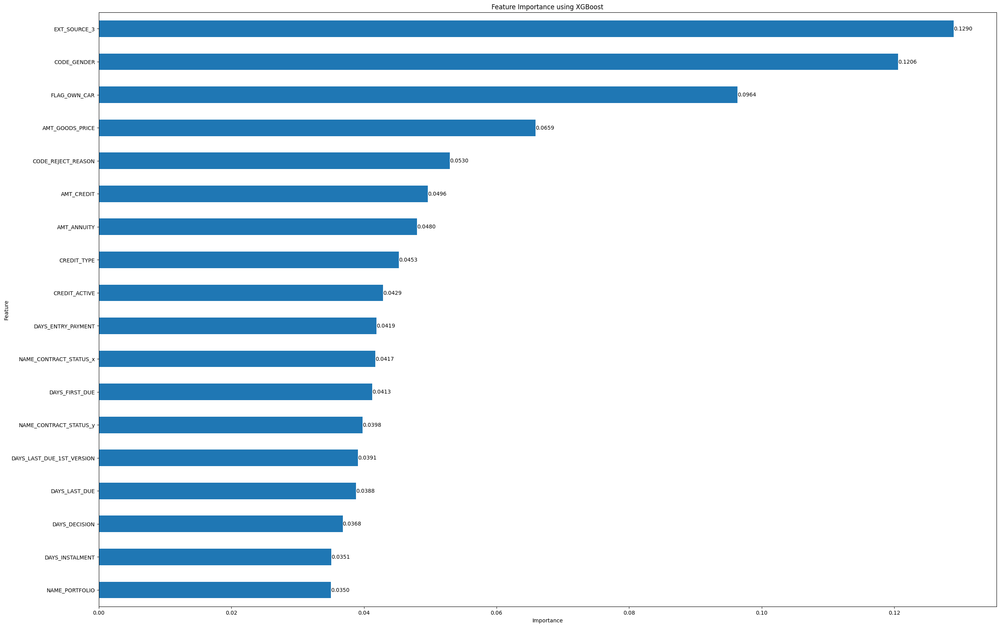

In [ ]:
X_new = pd.DataFrame(X_new)
coef_dtc = pd.Series(model_xgb_new.feature_importances_, index=X_new.columns)
plt.figure(figsize=(30, 20))
imp_coef_dtc = coef_dtc.sort_values()
imp_coef_dtc.plot(kind="barh")
plt.title("Feature Importance using XGBoost")

# Menambahkan label nilai pada setiap bar chart
for i, v in enumerate(imp_coef_dtc):
    plt.text(v, i, f"{v:.4f}", color='black', va='center')

plt.xlabel("Importance")
plt.ylabel("Feature")
plt.show()

Berdasarkan feature - feature yang penting di dapatkanlah beberapa feature yang paling mempengaruhi, tiga diantar feature yang sangat berpengaruh tersebut adalah Ext_Source_3, Code_Gender, dan Flag_Own_Car.

# **Learning Curve**

In [ ]:
from sklearn.model_selection import learning_curve

# Definisikan jumlah data yang akan digunakan untuk melihat learning curve
train_sizes, train_scores, test_scores = learning_curve(model_xgb_new, X_new, y_new, train_sizes=[0.2, 0.4, 0.6, 0.8, 1.0], cv=5)

# Hitung rata-rata dan standard deviation dari skor training dan testing
train_mean = np.mean(train_scores, axis=1)
train_std = np.std(train_scores, axis=1)
test_mean = np.mean(test_scores, axis=1)
test_std = np.std(test_scores, axis=1)

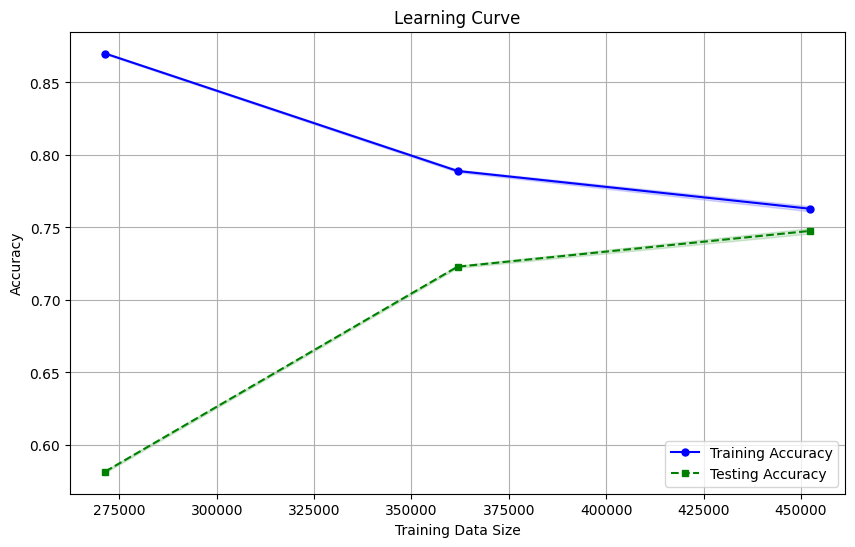

In [ ]:
# Plot learning curve
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, train_mean, color='blue', marker='o', markersize=5, label='Training Accuracy')
plt.fill_between(train_sizes, train_mean - train_std, train_mean + train_std, alpha=0.15, color='blue')
plt.plot(train_sizes, test_mean, color='green', linestyle='--', marker='s', markersize=5, label='Testing Accuracy')
plt.fill_between(train_sizes, test_mean - test_std, test_mean + test_std, alpha=0.15, color='green')
plt.title('Learning Curve')
plt.xlabel('Training Data Size')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.grid(True)
plt.show()

# **ROC CURVE**


In [ ]:
# Menghitung nilai AUC-ROC
auc_score = roc_auc_score(y_new_test, pred_xgb_new)

# Mendapatkan false positive rate (fpr) dan true positive rate (tpr)
fpr, tpr, thresholds = roc_curve(y_new_test, pred_xgb_new)

In [ ]:
print(auc_score)

0.7475134572728371


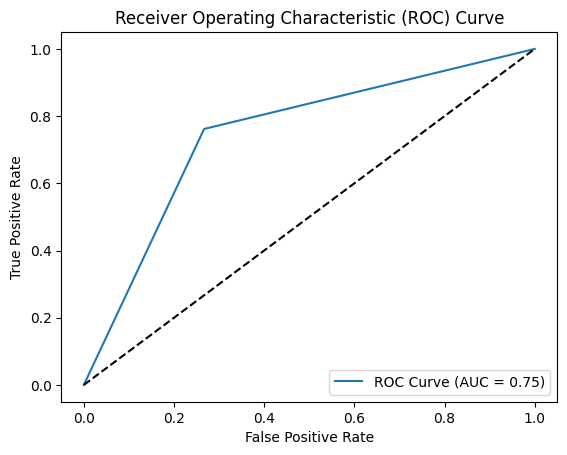

In [ ]:
# Membuat plot kurva ROC
plt.plot(fpr, tpr, label='ROC Curve (AUC = {:.2f})'.format(auc_score))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()

Penerimaan model XGBoost sebesar 75% Semakin mendekati 1, model semakin baik.

# **Hasil Prediksi Churn**

Berikut ini merupakan hasil prediksi customer yang churn atau tidak churn.

In [ ]:
result = pd.DataFrame({'Actual' : y_new_test, 'Predicted' : pred_xgb_new}) #Membandingkan data test actual dengan hasil prediksi
result #Menampilkan tabel hasil perbandingan data test actual dengan hasil prediksi

,Actual,Predicted
19443,1.0,1
265085,1.0,1
138139,1.0,0
31840,1.0,1
479853,0.0,0
...,...,...
40525,1.0,0
529065,0.0,0
341773,0.0,0
434768,0.0,0


In [ ]:
import plotly.express as px

labels = ['Churn','Loyal']
churn_or_not = result['Predicted'].value_counts().tolist()
values = [churn_or_not[0], churn_or_not[1]]

fig = px.pie(values=result['Predicted'].value_counts(), names=labels , width=700, height=400, color_discrete_sequence=["Lime","Maroon"]
             ,title="Churn or Loyal")
fig.show()

Diketahui dari hasil prediksi bahwa lebih banyak orang yang melakukan churn daripada yang tidak, dimana persentasinya sebesar 51.3% untuk orang - orang yang churn.

In [ ]:
m7.to_csv('Data_Siap_Visual.csv', index=False)

# Mengdecode Dataset

In [ ]:
fix = pd.read_csv('/content/drive/MyDrive/Data Science/Hasil_Merge.csv')
fix

<ipython-input-46-1a82fb67283e>:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  fix = pd.read_csv('/content/drive/MyDrive/Data Science/Hasil_Merge.csv')


,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,NAME_CONTRACT_STATUS_y,DAYS_DECISION,CODE_REJECT_REASON,NAME_PORTFOLIO,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_PAYMENT
0,100002.0,1.0,Cash loans,M,N,Y,0.0,High,406597.5,24700.5,...,Approved,-606.0,XAP,POS,-565.0,125.0,-25.0,-115.0,-133.0,9251.775
1,100003.0,0.0,Cash loans,F,N,N,0.0,High,1293502.5,35698.5,...,Approved,-746.0,XAP,Cash,-716.0,-386.0,-536.0,-686.0,-690.0,98356.990
2,100004.0,0.0,Revolving loans,M,Y,Y,0.0,Upper Middle,135000.0,6750.0,...,Approved,-815.0,XAP,POS,-784.0,-694.0,-724.0,-754.0,-763.0,5357.250
3,100006.0,0.0,Cash loans,F,N,Y,0.0,Upper Middle,312682.5,29686.5,...,Approved,-181.0,XAP,Cash,-151.0,1259.0,-151.0,-221.0,-226.0,29027.520
4,100007.0,0.0,Cash loans,M,N,Y,0.0,Upper Middle,513000.0,21865.5,...,Approved,-865.0,XAP,Cash,-834.0,-324.0,-354.0,-2236.0,-2234.0,1834.290
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307503,456251.0,0.0,Cash loans,M,N,N,0.0,Upper Middle,254700.0,27558.0,...,Approved,-273.0,XAP,POS,-210.0,0.0,-30.0,-60.0,-101.0,6605.910
307504,456252.0,0.0,Cash loans,F,N,Y,0.0,Upper Middle,269550.0,12001.5,...,Approved,-2497.0,XAP,POS,-2466.0,-2316.0,-2316.0,-2316.0,-2328.0,10046.880
307505,456253.0,0.0,Cash loans,F,N,Y,0.0,Upper Middle,677664.0,29979.0,...,Approved,-1909.0,XAP,POS,-1866.0,-1716.0,-1716.0,-2722.0,-2744.0,3971.880
307506,456254.0,1.0,Cash loans,F,N,Y,0.0,Upper Middle,370107.0,20205.0,...,Approved,-277.0,XAP,POS,-247.0,203.0,365243.0,-67.0,-78.0,19065.824


## Encoding

In [ ]:
from sklearn.preprocessing import LabelEncoder
LE = LabelEncoder()


In [ ]:
# Encode Variable Categorical
fix['NAME_CONTRACT_TYPE'] = LE.fit_transform(fix['NAME_CONTRACT_TYPE'])
fix['CODE_GENDER'] = LE.fit_transform(fix['CODE_GENDER'])
fix['FLAG_OWN_CAR'] = LE.fit_transform(fix['FLAG_OWN_CAR'])
fix['FLAG_OWN_REALTY'] = LE.fit_transform(fix['FLAG_OWN_REALTY'])
fix['AMT_INCOME_TOTAL'] = LE.fit_transform(fix['AMT_INCOME_TOTAL'])
fix['NAME_TYPE_SUITE'] = LE.fit_transform(fix['NAME_TYPE_SUITE'])
fix['NAME_INCOME_TYPE'] = LE.fit_transform(fix['NAME_INCOME_TYPE'])
fix['NAME_FAMILY_STATUS'] = LE.fit_transform(fix['NAME_FAMILY_STATUS'])
fix['NAME_HOUSING_TYPE'] = LE.fit_transform(fix['NAME_HOUSING_TYPE'])
fix['DAYS_BIRTH'] = LE.fit_transform(fix['DAYS_BIRTH'])
fix['OCCUPATION_TYPE'] = LE.fit_transform(fix['OCCUPATION_TYPE'])
fix['CREDIT_ACTIVE'] = LE.fit_transform(fix['CREDIT_ACTIVE'])
fix['CREDIT_TYPE'] = LE.fit_transform(fix['CREDIT_TYPE'])
fix['NAME_CONTRACT_STATUS_x'] = LE.fit_transform(fix['NAME_CONTRACT_STATUS_x'])
fix['NAME_CONTRACT_STATUS_y'] = LE.fit_transform(fix['NAME_CONTRACT_STATUS_y'])
fix['CODE_REJECT_REASON'] = LE.fit_transform(fix['CODE_REJECT_REASON'])
fix['NAME_PORTFOLIO'] = LE.fit_transform(fix['NAME_PORTFOLIO'])


## Handling Imbalance

In [ ]:
from sklearn.utils import resample
df_majority = fix[(fix['TARGET']==0)]
df_minority = fix[(fix['TARGET']==1)]

df_minority_upsampled = resample(df_minority, replace = True, n_samples = 282683, random_state = 42)

fix = pd.concat([df_minority_upsampled, df_majority])

In [ ]:
fix['TARGET'].value_counts()

1.0    282683
0.0    282683
Name: TARGET, dtype: int64

## Future Selection

In [ ]:
real_fix = fix[['TARGET','CODE_GENDER', 'FLAG_OWN_CAR', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'EXT_SOURCE_3',
 'CREDIT_ACTIVE', 'CREDIT_TYPE', 'NAME_CONTRACT_STATUS_x', 'NAME_CONTRACT_STATUS_y', 'DAYS_DECISION', 'CODE_REJECT_REASON',
  'NAME_PORTFOLIO', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE', 'DAYS_INSTALMENT', 'DAYS_ENTRY_PAYMENT','SK_ID_CURR']]

In [ ]:
real_fix.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 565366 entries, 292659 to 307507
Data columns (total 20 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   TARGET                     565366 non-null  float64
 1   CODE_GENDER                565366 non-null  int64  
 2   FLAG_OWN_CAR               565366 non-null  int64  
 3   AMT_CREDIT                 565366 non-null  float64
 4   AMT_ANNUITY                565366 non-null  float64
 5   AMT_GOODS_PRICE            565366 non-null  float64
 6   EXT_SOURCE_3               565366 non-null  float64
 7   CREDIT_ACTIVE              565366 non-null  int64  
 8   CREDIT_TYPE                565366 non-null  int64  
 9   NAME_CONTRACT_STATUS_x     565366 non-null  int64  
 10  NAME_CONTRACT_STATUS_y     565366 non-null  int64  
 11  DAYS_DECISION              565366 non-null  float64
 12  CODE_REJECT_REASON         565366 non-null  int64  
 13  NAME_PORTFOLIO          

## Split Data

In [ ]:
#X variable independen
X_new = real_fix.loc[:, real_fix.columns != 'TARGET']

#y variable dependen
y_new = real_fix['TARGET']

In [ ]:
from sklearn.model_selection import train_test_split
X_new_train, X_new_test, y_new_train, y_new_test = train_test_split(X_new,y_new,test_size=0.3, random_state=100)
print(X_new_train.shape)
print(X_new_test.shape)
print(y_new_train.shape)
print(y_new_test.shape)

(395756, 19)
(169610, 19)
(395756,)
(169610,)


In [ ]:
# real_fix['SK_ID_CURR'] = real_fix['SK_ID_CURR'].replace('Tidak Terdeteksi', np.nan)

# real_fix['SK_ID_CURR'] = real_fix['SK_ID_CURR'].fillna(0)

# real_fix['SK_ID_CURR'] = real_fix['SK_ID_CURR'].astype(int)

# real_fix['SK_ID_CURR'] = pd.to_numeric(real_fix['SK_ID_CURR'], errors='coerce')

real_fix.drop(real_fix[real_fix['SK_ID_CURR']=='Tidak Terdeteksi'].index, inplace = True)


<ipython-input-108-82b08c262141>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_fix.drop(real_fix[real_fix['SK_ID_CURR']=='Tidak Terdeteksi'].index, inplace = True)


In [ ]:
real_fix.isnull().sum()

TARGET                       0
CODE_GENDER                  0
FLAG_OWN_CAR                 0
AMT_CREDIT                   0
AMT_ANNUITY                  0
AMT_GOODS_PRICE              0
EXT_SOURCE_3                 0
CREDIT_ACTIVE                0
CREDIT_TYPE                  0
NAME_CONTRACT_STATUS_x       0
NAME_CONTRACT_STATUS_y       0
DAYS_DECISION                0
CODE_REJECT_REASON           0
NAME_PORTFOLIO               0
DAYS_LAST_DUE_1ST_VERSION    0
DAYS_FIRST_DUE               0
DAYS_LAST_DUE                0
DAYS_INSTALMENT              0
DAYS_ENTRY_PAYMENT           0
SK_ID_CURR                   0
dtype: int64

In [ ]:
real_fix = real_fix.drop_duplicates(subset=['SK_ID_CURR'], keep = 'first')
real_fix.shape

(307508, 20)

## Modeling (Lagi)

In [ ]:
import xgboost as xgb
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score # checking performance of model

model_xgb_new = xgb.XGBClassifier(max_depth = 7,  objective='binary:logistic', learning_rate=0.1, n_estimators=300, gamma=0.1, )
model_xgb_new.fit(X = X_new_train, y = y_new_train)
pred_xgb_new = model_xgb_new.predict(X_new_test)

print('CONFUSION MATRIX')
print(confusion_matrix(y_new_test, pred_xgb_new))

CONFUSION MATRIX
[[62360 22891]
 [20260 64099]]


In [ ]:
accuracy = accuracy_score(y_new_test, pred_xgb_new)
print(f'Accuracy yang didapatkan dari Gradient Boosting: {accuracy:.5f}')

Accuracy yang didapatkan dari Gradient Boosting: 0.74559


# Predict Proba per Customers

In [ ]:
# Memprediksi probabilitas per customer menggunakan model_xgb_new
prediction_proba = model_xgb_new.predict_proba(X_new_train)

X_new_train = X_new_train.reset_index(drop=True)

# Membuat dataframe hasil prediksi
df_prediction = pd.DataFrame(prediction_proba, columns=['No Churn', 'Churn'])
df_prediction['SK_ID_CURR'] = X_new_train['SK_ID_CURR']
df_prediction = df_prediction[['SK_ID_CURR', 'Churn']]

df_prediction = df_prediction.groupby('SK_ID_CURR')['Churn'].mean().reset_index()


# Menampilkan dataframe hasil prediksi
print(df_prediction)

        SK_ID_CURR     Churn
0              0.0  0.354699
1         100002.0  0.881027
2         100003.0  0.094347
3         100004.0  0.044994
4         100006.0  0.172398
...            ...       ...
222249    456247.0  0.113725
222250    456248.0  0.247976
222251    456253.0  0.265209
222252    456254.0  0.691432
222253    456255.0  0.542247

[222254 rows x 2 columns]


Hasil prediksi diatas merupakan prediksi probabilitas orang - orang yang churn dan dapat diketahui sk_id dari orang - orang yang melakukan churn tersebut.

In [ ]:
df_prediction.to_csv('data_udh_proba.csv', index=False)

In [ ]:
test = pd.read_csv('/content/drive/MyDrive/Data Science/Hasil_Merge.csv')


<ipython-input-4-a99878507a58>:1: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  test = pd.read_csv('/content/drive/MyDrive/Data Science/Hasil_Merge.csv')


In [ ]:
test['TARGET'].value_counts()

0.0    282683
1.0     24825
Name: TARGET, dtype: int64